In [1]:
%matplotlib qt
import mne
import os
os.environ['PYDEVD_DISABLE_FILE_VALIDATION'] = '1'
import matplotlib.pyplot as plt
import numpy as np

### Read Raw data from .mff file

In [2]:
subject_id = "S005"
recording_str = '0403_014413'# '0403_014413', '0327_110047', "0403_125105"
data_path = "~/csharp_data"
raw = mne.io.read_raw_egi(f"{data_path}/{subject_id}/eeg/KHNCL-NetStation/{subject_id}_V1Loc_2026{recording_str}.mff", preload=True)

Reading EGI MFF Header from /Users/yvonnafeng/csharp_data/S005/eeg/KHNCL-NetStation/S005_V1Loc_20260403_014413.mff...
    Reading events ...
    Assembling measurement info ...
    Excluding events {} ...
Reading 0 ... 440693  =      0.000 ...   881.386 secs...


In [16]:
raw.info

<Info | 10 non-empty values
 bads: []
 ch_names: E1, E2, E3, E4, E5, E6, E7, E8, E9, E10, E11, E12, E13, E14, ...
 chs: 129 EEG, 4 Stimulus
 custom_ref_applied: False
 device_info: 1 item (dict)
 dig: 132 items (3 Cardinal, 129 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: 2026-04-01 06:43:57 UTC
 nchan: 133
 projs: []
 sfreq: 500.0 Hz
 utc_offset: -0700
>

In [17]:
print(raw.annotations)

# The total duration MNE reports will be ~764s of actual data
print(f"Total duration: {raw.times[-1]:.1f} s")

<Annotations | 375 segments: 194v (8), 610c (40), BAD_ACQ_SKIP (7), DIN4 ...>
Total duration: 881.4 s


In [11]:
mne.find_events(raw)
# DIN4 (40) Event IDs=1: start of the trial
# DIN5 (40*7=280) Event IDs=2: marks “bins” within the trial that contain integer numbers of cycles of all stimulus-related frequencies
#       Segment rejection should be done on the basis of bins

Finding events on: DIN4, DIN5, 194v, 610c
40 events found on stim channel DIN4
Event IDs: [1]
280 events found on stim channel DIN5
Event IDs: [2]
8 events found on stim channel 194v
Event IDs: [3]
40 events found on stim channel 610c
Event IDs: [4]


array([[    49,      0,      3],
       [  3503,      0,      4],
       [  3547,      0,      1],
       ...,
       [479948,      0,      2],
       [480948,      0,      2],
       [481949,      0,      2]])

In [3]:
# Time-series: pan through, spot bad channels, big artifacts
raw.plot()

# Power spectrum: see line noise, drift, SSVEP frequencies
raw.set_channel_types({'VREF': 'misc'})
raw.compute_psd(fmin=0, fmax=60, picks='eeg',n_fft=5000, n_overlap=0).plot(average=False, spatial_colors=True)

# Sensor layout: channel positions
raw.plot_sensors(show_names=True)

# Summary stats: variance per channel — outliers are bad channels
import numpy as np
data, _ = raw.get_data(return_times=True)
chan_var = np.var(data, axis=1)
# plot or sort to find outlier channels

Using matplotlib as 2D backend.
Setting 58397 of 440694 (13.25%) samples to NaN, retaining 382297 (86.75%) samples.
Effective window size : 10.000 (s)


/var/folders/rx/k_w1968j5csfrjnxctr1xrsm0000gn/T/ipykernel_23006/2800633179.py:5: RuntimeWarning: The unit for channel(s) VREF has changed from V to NA.
  raw.set_channel_types({'VREF': 'misc'})


Plotting power spectral density (dB=True).


Channels marked as bad:
none


In [ ]:
report = mne.Report(title='EEG Preprocessing - S001', verbose=True)
report.add_raw(raw, title='1. Raw data', psd=True)

## EEG Preprocessing

### Filtering

harmonices: 5 (10, 20, 30, 40, 50), 6 (12, 24, 36, 48, 60), 7.5 (15, 30, 45, 60, 75) Hz

- High-pass filter (0.1–1 Hz): removes slow drifts. For ERP/evoked, 0.1 Hz is safer; for oscillation analysis, 1 Hz is fine. (high-pass > 1 Hz can distort ERPs.)
- Low-pass filter (40–100 Hz): removes high-frequency noise and line noise harmonics. 40–50 Hz is typical for ERP.
- Notch filter (60 Hz for US, 50 Hz for EU): removes power line noise. raw.notch_filter(60).

In [4]:
# low pass and high pass filter
# do the low and high pass separately
raw_fil = raw.copy().filter(l_freq=0.5, h_freq=85) # ICA has known issue for low high-pass cutoffs
raw_fil.notch_filter(freqs=60)

# visualization
# Compare PSD before vs after on same axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
raw.compute_psd(fmax=80, picks='eeg', n_fft=5000).plot(axes=ax1, show=False)
raw_fil.compute_psd(fmax=80, picks='eeg',n_fft=5000).plot(axes=ax2, show=False)
ax1.set_title('Raw')
ax2.set_title('Filtered')
plt.tight_layout()
plt.show()
# Should see: 60Hz notch, HP rolloff below 1Hz, LP rolloff above 50Hz

Filtering raw data in 8 contiguous segments
Setting up band-pass filter from 0.5 - 85 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 85.00 Hz
- Upper transition bandwidth: 21.25 Hz (-6 dB cutoff frequency: 95.62 Hz)
- Filter length: 3301 samples (6.602 s)

Filtering raw data in 8 contiguous segments
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband

/var/folders/rx/k_w1968j5csfrjnxctr1xrsm0000gn/T/ipykernel_23006/426668015.py:13: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


### Bad Channel Detection

mne.preprocessing.find_bad_channels_maxwell() if you have sensor positions, or heuristics on variance/correlation

mark then with raw.info['bads']
will interpolate them later (after ICA) by raw.interpolate_bads()

In [5]:
fig = raw_fil.plot()

Channels marked as bad:
['E48', 'E31', 'E7', 'E55']


In [37]:
noisy_chs, scores = mne.preprocessing.find_bad_channels_lof(raw_fil, return_scores=True)
print(noisy_chs)
print(scores)

LOF: Detected bad channel(s): ['E6', 'E14', 'E36', 'E42', 'E73', 'E81', 'E94', 'E96', 'E98', 'E99', 'E105', 'E111', 'E116']
['E6', 'E14', 'E36', 'E42', 'E73', 'E81', 'E94', 'E96', 'E98', 'E99', 'E105', 'E111', 'E116']
[-1.14998554 -1.02356937 -0.99202835 -1.02552366 -1.00319492 -1.63899402
 -0.97976731 -1.02477407 -1.01622852 -1.09642827 -0.98065365 -0.9739905
 -1.01387171 -1.56364796 -1.0139619  -1.03260525 -0.96300986 -0.96659641
 -1.21033409 -0.95159094 -1.48801249 -1.01382732 -1.45841229 -1.08095185
 -0.96612096 -1.0248586  -1.10812033 -0.98644066 -1.22743642 -1.29166203
 -1.0684849  -0.98152585 -1.15992605 -1.07685496 -1.3191756  -2.6130237
 -1.13782424 -0.98469561 -1.03279424 -1.07791294 -1.15094462 -1.91613608
 -1.45726867 -1.08144197 -1.20475529 -1.03635565 -0.99002807 -1.27594731
 -1.04785843 -1.03169268 -0.97487146 -0.98356774 -1.10142211 -1.02177939
 -1.41858633 -0.98569088 -0.98275365 -1.39548805 -0.98201526 -0.9704278
 -0.96055282 -1.36452412 -1.01489579 -1.03265776 -0.980

In [7]:
raw_fil.info['bads'] = ['E48', 'E31', 'E7', 'E55']
fig = raw_fil.plot_sensors(show_names=True)

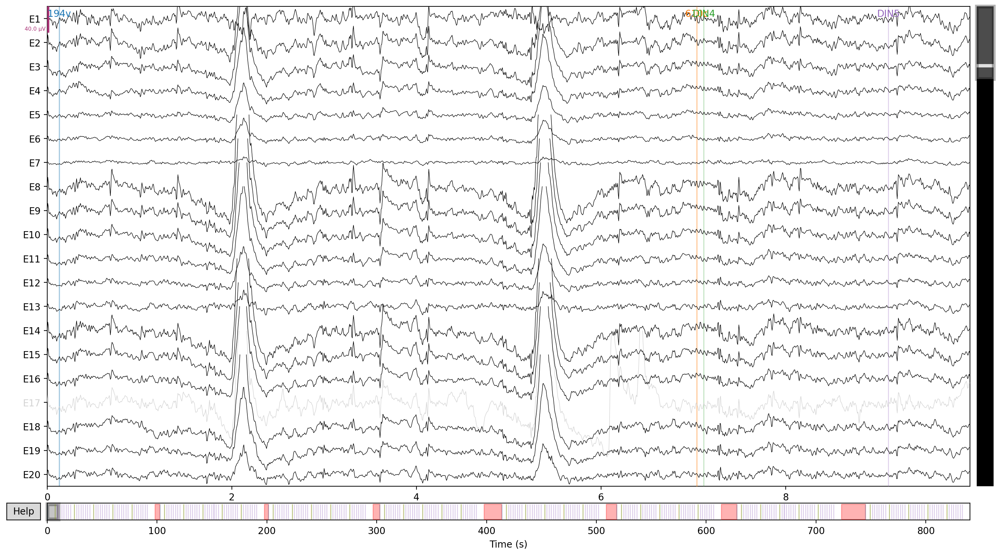

Channels marked as bad:
['E17']


In [58]:
raw_fil.plot()

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 99.3 mm
Computing interpolation matrix from 127 sensor positions
Interpolating 1 sensors


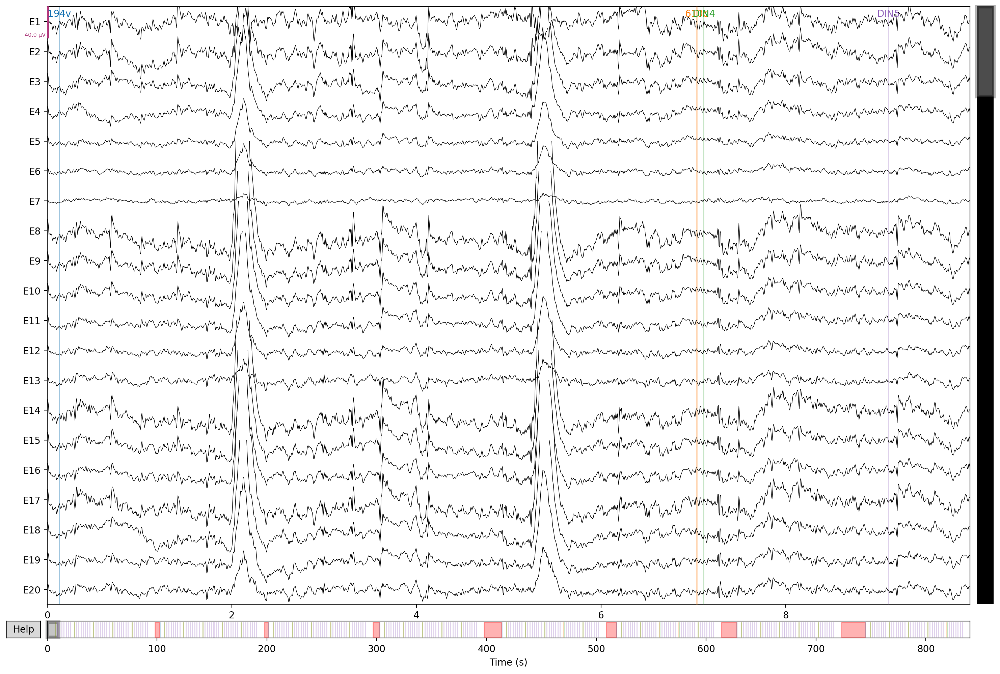

Channels marked as bad:
none


In [7]:
raw_fil.interpolate_bads(reset_bads=True)   # reset_bads clears info['bads'] after interpolation
raw_fil.plot()

### ICA (Independent Component Analysis)

For visual experiments (retinotopy), we DO NOT do ICA

ICA decomposes the signal into statistically independent sources. Blink artifacts (frontal, stereotyped) and heartbeat artifacts (regular ~1Hz) are almost always separable and can be zeroed out without touching your neural data. This is the standard replacement for epoch rejection at the signal level.

Note: for MEG, we do SSS/SSP with Fosters inverse

Fitting ICA to data using 127 channels (please be patient, this may take a while)
Omitting 37817 of 420084 (9.00%) samples, retaining 382267 (91.00%) samples.
Selecting by number: 25 components
Fitting ICA took 18.3s.


/var/folders/rx/k_w1968j5csfrjnxctr1xrsm0000gn/T/ipykernel_64462/3168222274.py:4: RuntimeWarning: Using n_components=25 (resulting in n_components_=25) may lead to an unstable mixing matrix estimation because the ratio between the largest (1.3e+02) and smallest (2.5e-06) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 5
  ica.fit(raw_fil)  # fit on high-pass filtered (≥1Hz) copy


Creating RawArray with float64 data, n_channels=25, n_times=420084
    Range : 0 ... 420083 =      0.000 ...   840.166 secs
Ready.


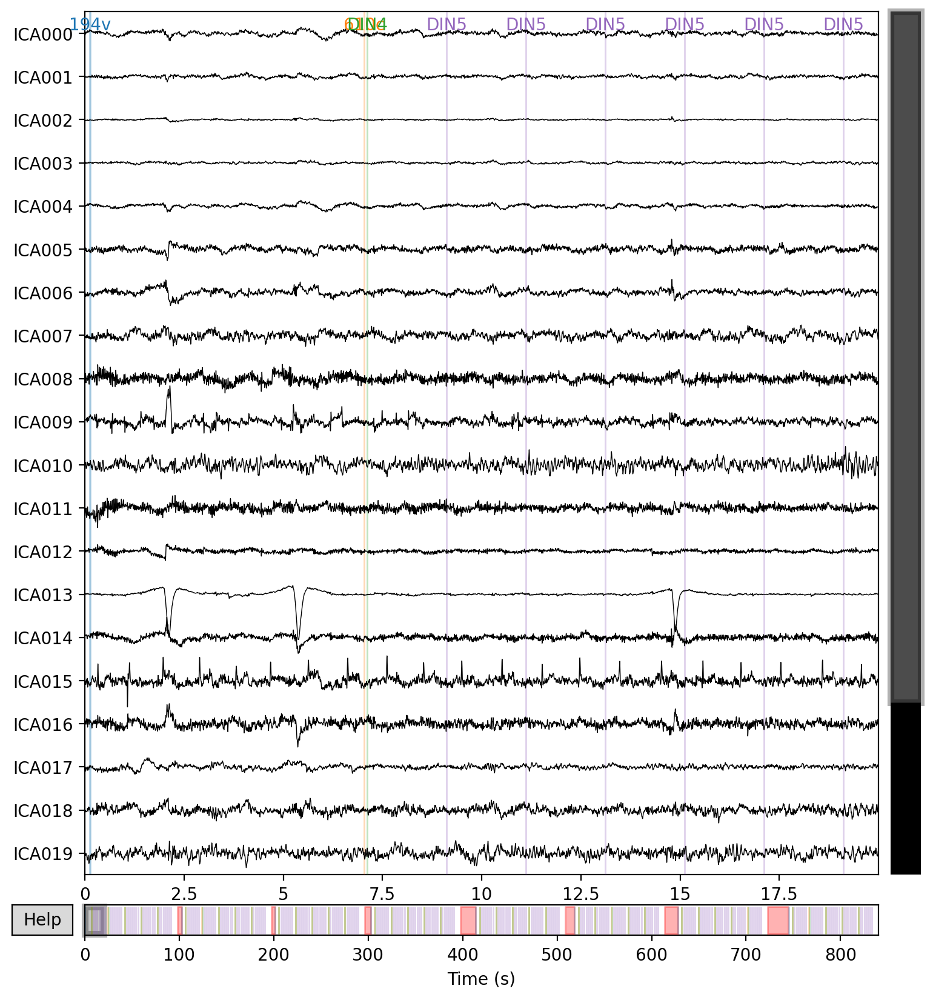

In [27]:
from mne.preprocessing import ICA

ica = ICA(n_components=25, method='fastica', random_state=42) # can use 'picard' if fastica fails to converge
ica.fit(raw_fil)  # fit on high-pass filtered (≥1Hz) copy
ica.plot_components()  # identify eye blink / muscle / heartbeat components
ica.plot_sources(raw_fil)  # Time series of all components — look for stereotyped blink/heartbeat patterns

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
375 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
375 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
375 matching events found
No baseline correction applied
0 projection items activated
Applying ICA to Raw instance
    Transforming to ICA space (25 components)
    Zeroing out 1 ICA component
    Projecting back using 127 PCA components


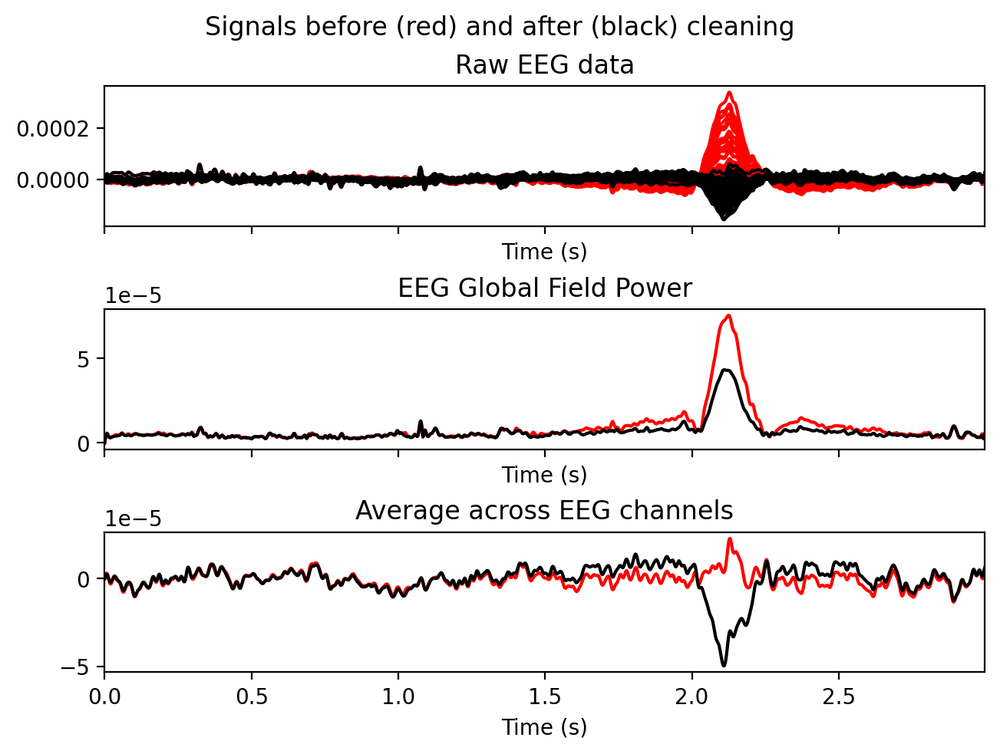

In [28]:
ica.plot_properties(raw_fil, picks=[13,14,20]) # specific component: topo + time series + PSD + EOG epochs
# Component is a blink if: frontal topo, ~1Hz peak in PSD, sharp spikes in time series
ica.exclude = [13]   # mark bad components
ica.plot_overlay(raw_fil, exclude=ica.exclude) # verify what gets removed; Shows original (gray) vs cleaned (color)

Using EOG channel: E25
Omitting 37817 of 420084 (9.00%) samples, retaining 382267 (91.00%) samples.
Omitting 37817 of 420084 (9.00%) samples, retaining 382267 (91.00%) samples.
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidt

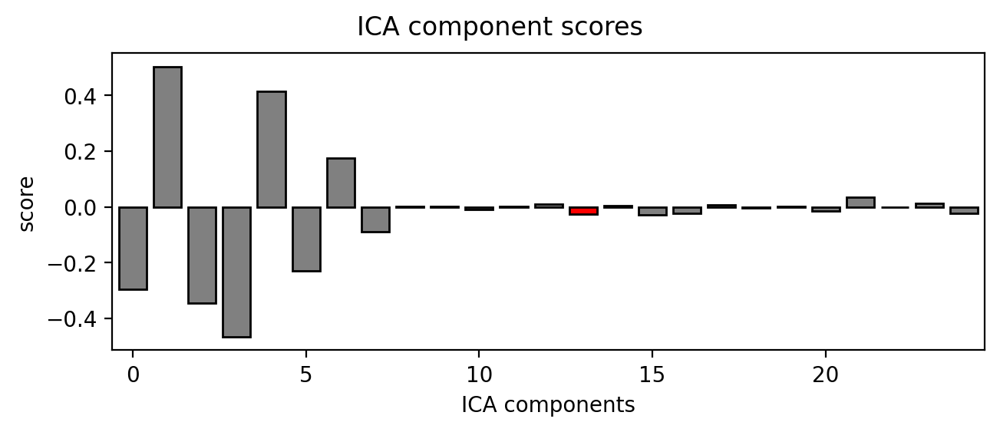

In [ ]:
# automated detection as a guide
# Use frontal channel as EOG proxy for blinks
eog_indices, eog_scores = ica.find_bads_eog(raw_fil, ch_name='E25')  # frontal channel on EGI
ica.plot_scores(eog_scores)

In [9]:
raw_clean = raw_fil.copy()
# ica.apply(raw_clean)         # remove from the raw

### Re-referencing

after bad channel interpolation, re-reference to average reference

In [10]:
raw_clean.set_eeg_reference('average', projection=True)
raw_clean.apply_proj()

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...


<RawMff | signal1.bin, 133 x 440694 (881.4 s), ~447.3 MiB, data loaded>

/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


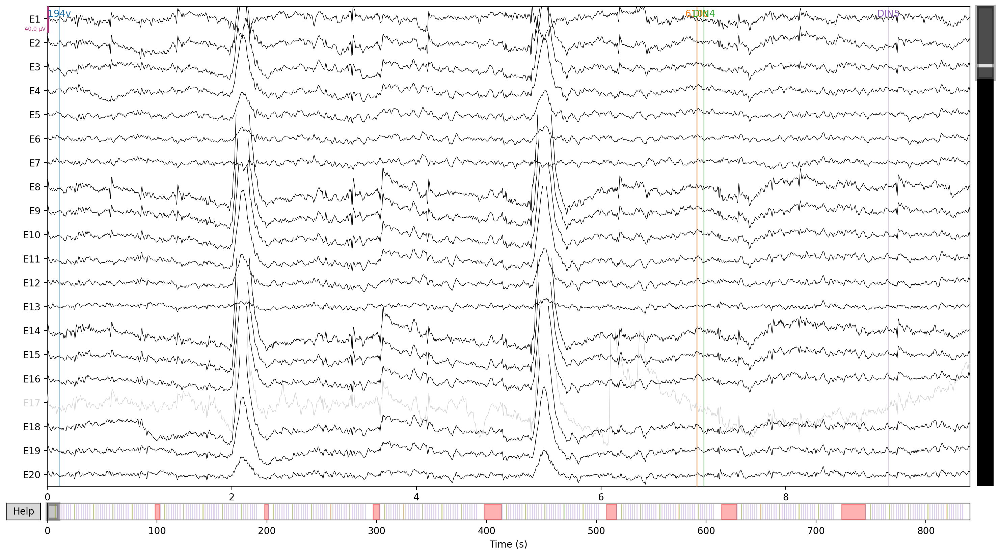

Channels marked as bad:
['E17']


In [29]:
raw_clean.plot()

Setting 58397 of 440694 (13.25%) samples to NaN, retaining 382297 (86.75%) samples.
Effective window size : 10.000 (s)
Plotting power spectral density (dB=True).


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


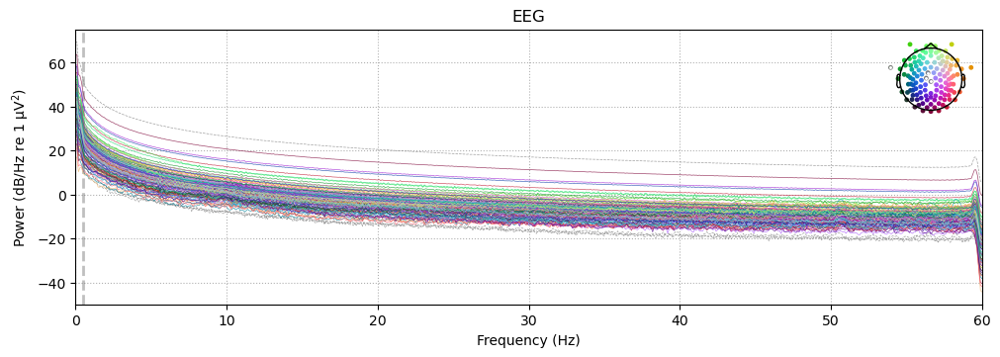

In [11]:
raw_clean.compute_psd(fmin=0,fmax=60,picks='eeg',n_fft=5000).plot(average=False)

### Epoching

After cleaning raw, epoch around DIN5 (epoch marker)

For retinotopy task: probably want baseline=None because we are using the prelude bin (DIN5 bin 1 of each trial) as the baseline, which requires custom logic — you'd subtract the mean of that bin from the corresponding stimulus bins.

Finding events on: DIN4
40 events found on stim channel DIN4
Event IDs: [1]
Finding events on: DIN5
280 events found on stim channel DIN5
Event IDs: [2]
Not setting metadata
280 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated
Using data from preloaded Raw for 280 events and 1000 original time points ...
0 bad epochs dropped
Not setting metadata
280 matching events found
No baseline correction applied
0 projection items activated


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


combining channels using "mean"


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


Effective window size : 2.000 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


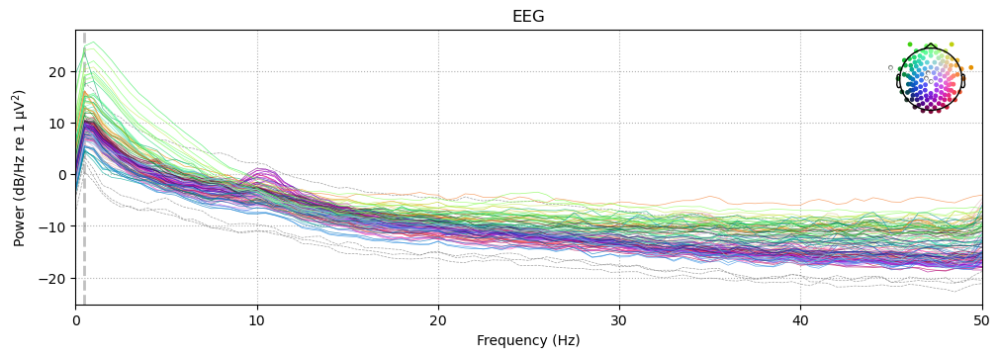

In [12]:
# preserve all epochs, including prelude and postlude
from run_eeg_preproc import run_epoching

epochs = run_epoching(raw, raw_clean, tmin=0, tmax=2.0, core_only=False, report=None)
# Browse epochs interactively — click to mark/unmark bad
epochs.plot()
# Image plot: rows=epochs, columns=time, color=amplitude — great for spotting patterns
epochs.plot_image(picks='eeg', combine='mean')

# PSD of epochs — should see your SSVEP peaks here
epochs.compute_psd(method="welch", fmin=0, fmax=50, n_fft=len(epochs.times)).plot()

Finding events on: DIN4
40 events found on stim channel DIN4
Event IDs: [1]
Finding events on: DIN5
280 events found on stim channel DIN5
Event IDs: [2]
Not setting metadata
200 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated
Using data from preloaded Raw for 200 events and 1000 original time points ...
0 bad epochs dropped
Not setting metadata
200 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"
    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


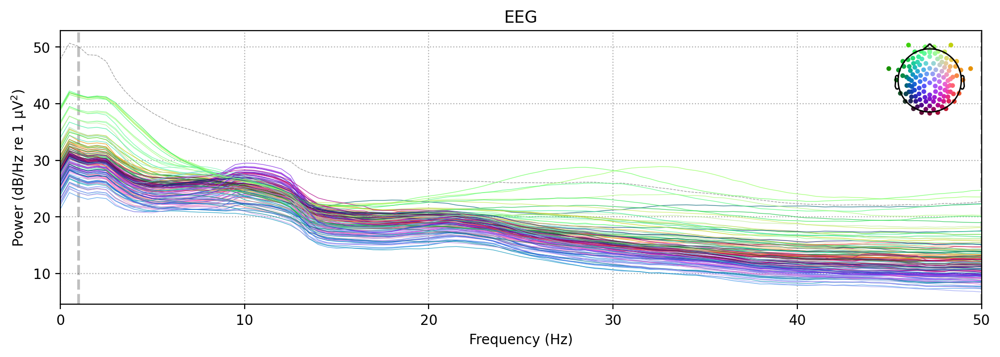

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
['E17']


In [ ]:
# OLD script - This is CORE bins ONLY

din4_events = mne.find_events(raw, stim_channel='DIN4')  # 40 events
din5_events = mne.find_events(raw, stim_channel='DIN5')  # 280 events

# For each DIN5, find which trial it belongs to and its position within that trial
din4_samples = din4_events[:, 0]
din5_samples = din5_events[:, 0]

bin_positions = []
for s in din5_samples:
    # which trial does this DIN5 belong to (last DIN4 before it)
    trial_idx = np.searchsorted(din4_samples, s, side='right') - 1
    # how many DIN5s came before this one within the same trial?
    trial_start = din4_samples[trial_idx]
    trial_end = din4_samples[trial_idx + 1] if trial_idx + 1 < len(din4_samples) else np.inf
    position = np.sum((din5_samples >= trial_start) & (din5_samples < s))
    bin_positions.append(position)  # 0 = first bin, 6 = last bin

bin_positions = np.array(bin_positions)

# Build new event array with position encoded as event ID
din5_labeled = din5_events.copy()
din5_labeled[:, 2] = bin_positions  # event IDs: 0,1,2,3,4,5,6

# Epoch only core bins (positions 1-5 if prelude=0, postlude=6)
core_events = din5_labeled[np.isin(bin_positions, [0, 1, 2, 3, 4])]
epochs = mne.Epochs(raw_clean, core_events, tmin=0, tmax=2.0-1/raw_clean.info['sfreq'], baseline=None, preload=True)

# Browse epochs interactively — click to mark/unmark bad
epochs.plot() # n_epochs=10, n_channels=30, scalings='auto'

# Image plot: rows=epochs, columns=time, color=amplitude — great for spotting patterns
epochs.plot_image(picks='eeg', combine='mean')

# PSD of epochs — should see your SSVEP peaks here
epochs.compute_psd(fmin=0, fmax=50).plot()

Effective window size : 2.002 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


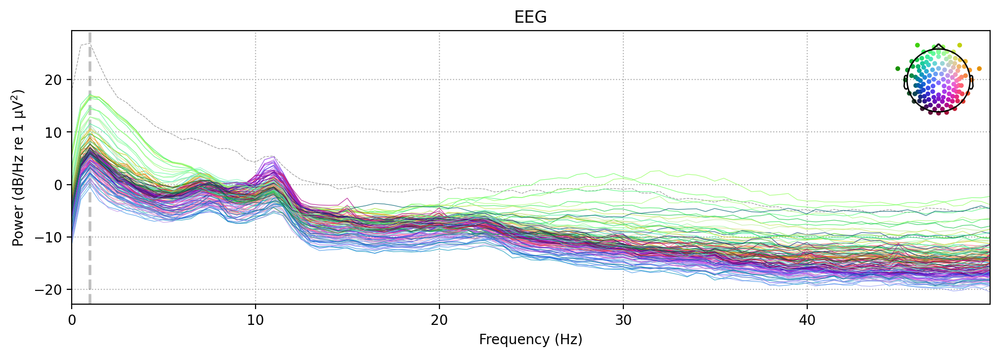

In [ ]:
# PSD of epochs — should see your SSVEP peaks here
epochs.compute_psd(method='welch',fmin=0, fmax=50,n_fft=len(epochs.times)).plot()

Projections have already been applied. Setting proj attribute to True.


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


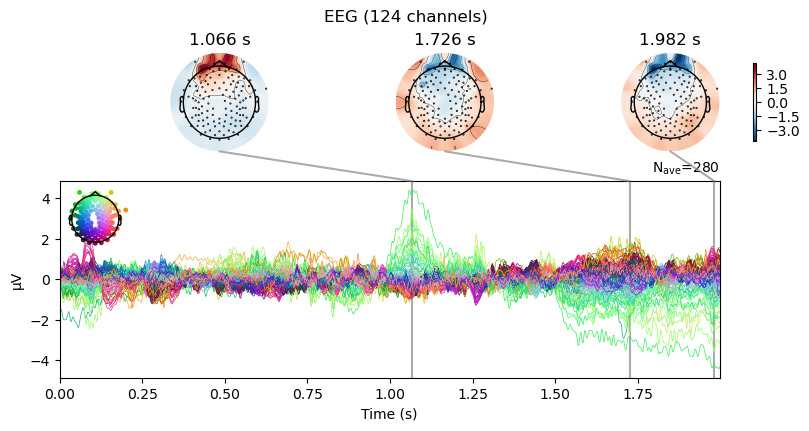

In [13]:
epochs.average().plot_joint()

### Epoch-Level Artifact Rejection

- Peak-to-peak threshold: the most common approach
This drops entire epochs (your 2s bins) rather than whole trials. You keep 6 good bins from a trial even if one is noisy.

- Autoreject (data-driven):
AutoReject does two things: (1) finds the optimal threshold per channel, and (2) for epochs where only a few channels are bad, it interpolates those channels from neighbors rather than dropping the whole epoch.

    Rejecting  epoch based on EEG : ['E1', 'E8']
    Rejecting  epoch based on EEG : ['E14', 'E25']
    Rejecting  epoch based on EEG : ['E8']
    Rejecting  epoch based on EEG : ['E14', 'E25']
    Rejecting  epoch based on EEG : ['E114']
    Rejecting  epoch based on EEG : ['E114']
    Rejecting  epoch based on EEG : ['E14']
    Rejecting  epoch based on EEG : ['E1']
    Rejecting  epoch based on EEG : ['E114']
    Rejecting  epoch based on EEG : ['E8']
    Rejecting  epoch based on EEG : ['E8']
    Rejecting  epoch based on EEG : ['E2']
    Rejecting  epoch based on EEG : ['E9', 'E14', 'E17', 'E21', 'E25']
    Rejecting  epoch based on EEG : ['E2', 'E3', 'E4', 'E8', 'E9', 'E10', 'E11', 'E12', 'E14', 'E15', 'E16', 'E17', 'E18', 'E19', 'E20', 'E21', 'E22', 'E23', 'E24', 'E25', 'E26', 'E27', 'E32', 'E43', 'E44', 'E45', 'E47', 'E49', 'E50', 'E51', 'E52', 'E53', 'E54', 'E56', 'E57', 'E58', 'E59', 'E60', 'E61', 'E62', 'E63', 'E64', 'E65', 'E66', 'E67', 'E68', 'E69', 'E70', 'E71', 'E72', 'E

/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


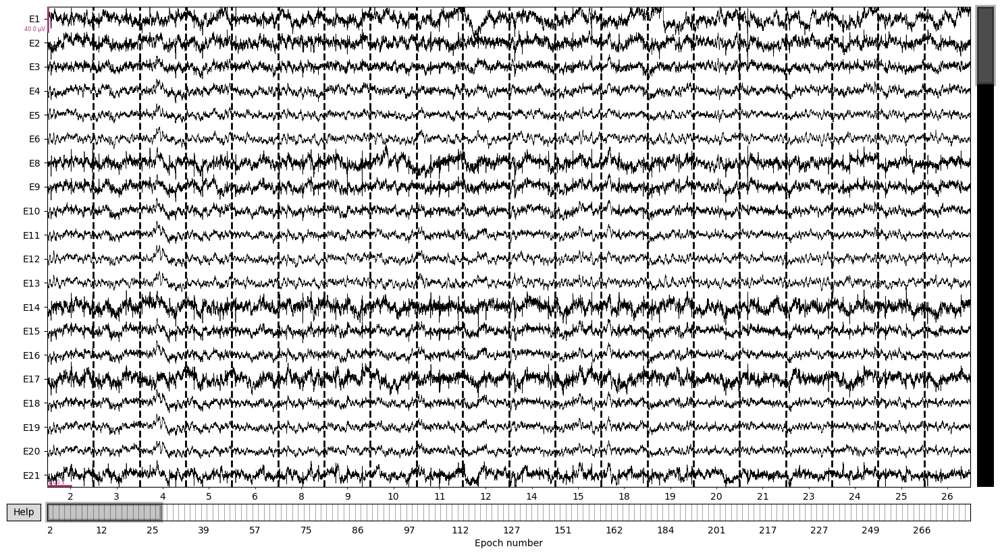

In [16]:
# peak-to-peak
reject = dict(eeg=60e-6)  # 150 µV peak-to-peak
epochs_peak_rej = epochs.copy()
epochs_peak_rej.drop_bad(reject=reject)
epochs_peak_rej.plot()

Dropped 65 epochs: 0, 1, 3, 10, 12, 16, 18, 20, 21, 27, 28, 31, 32, 33, 34, 35, 36, 37, 41, 47, 51, 56, 57, 60, 61, 69, 73, 74, 78, 79, 97, 103, 107, 112, 113, 114, 119, 120, 129, 131, 132, 133, 137, 138, 144, 147, 158, 169, 175, 176, 178, 188, 191, 194, 200, 206, 210, 223, 230, 239, 243, 252, 268, 271, 279
Custom artifact rejection summary
  Epochs total   : 280
  Epochs dropped : 65  (23.2%)
  Epochs kept    : 215  (76.8%)
  Rule 1 (>10% raw/flat bad)           : 65 epochs
  Rule 3 (≥7 channels > peak thresh) : 0 epochs

Thresholds (all peak-to-peak):
  raw_thresh   = 40 µV p-p  (≈ ±20 µV)
  peak_thresh  = 60 µV p-p  (≈ ±30 µV)
  flat_thresh  = 100.0 nV p-p
  max_bad_frac = 10%  (12 of 127 channels)

Distribution of max p-p across all epochs:
  p 25: 56.9 µV p-p
  p 50: 63.6 µV p-p
  p 75: 71.4 µV p-p
  p 90: 84.2 µV p-p
  p 95: 106.3 µV p-p
  p 99: 308.4 µV p-p
  max: 327.8 µV p-p

Distribution of n_peak channels per epoch (before dropping):
  p 50: 1.0 channels > 60 µV p-p
  p 75: 

/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


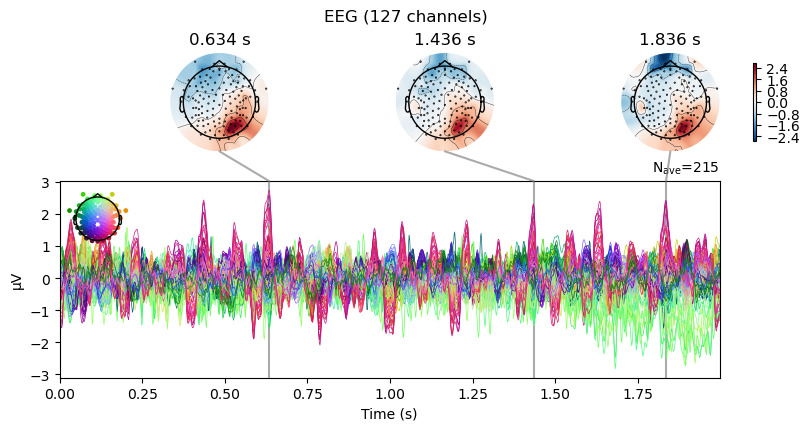

In [51]:
def run_artifact_rejection_custom(epochs,
                                  raw_thresh     = 40e-6,
                                  peak_thresh    = 60e-6,
                                  flat_thresh    = 1e-7,
                                  max_bad_frac   = 0.10,
                                  max_peak_count = 7,
                                  verbose        = True):
    data = epochs.get_data(picks='eeg')
    n_ep, n_ch, _ = data.shape
    ch_names = epochs.ch_names

    drop_idx, drop_log = [], []

    # Accumulate per-epoch stats for summary
    n_bad_per_epoch  = np.zeros(n_ep, dtype=int)
    n_peak_per_epoch = np.zeros(n_ep, dtype=int)
    max_ptp_per_epoch = np.zeros(n_ep)

    for i, ep in enumerate(data):
        ptp = ep.max(axis=1) - ep.min(axis=1)   # (n_ch,)

        raw_bad  = ptp > raw_thresh
        flat_bad = ptp < flat_thresh
        peak_bad = ptp > peak_thresh

        n_bad  = int((raw_bad | flat_bad).sum())
        n_peak = int(peak_bad.sum())
        n_bad_per_epoch[i]   = n_bad
        n_peak_per_epoch[i]  = n_peak
        max_ptp_per_epoch[i] = float(ptp.max())

        # Rule 1: >10% channels are raw/flat bad
        if n_bad > n_ch * max_bad_frac:
            reason = f'rule1'
            drop_idx.append(i)
            bad_chs = [ch_names[j] for j in np.where(raw_bad | flat_bad)[0]]
            drop_log.append({
                'epoch': i, 'rule': reason,
                'n_bad': n_bad, 'n_peak': n_peak,
                'bad_chs': bad_chs,
                'max_ptp_uV': ptp.max() * 1e6,
            })
            continue

        # Rule 3: ≥ max_peak_count channels exceed peak threshold
        if n_peak >= max_peak_count:
            reason = f'rule3'
            drop_idx.append(i)
            peak_chs = [ch_names[j] for j in np.where(peak_bad)[0]]
            drop_log.append({
                'epoch': i, 'rule': reason,
                'n_bad': n_bad, 'n_peak': n_peak,
                'peak_chs': peak_chs,
                'max_ptp_uV': ptp.max() * 1e6,
            })
            continue

    # ── Drop ──────────────────────────────────────────────────────────────────
    epochs_clean = epochs.copy().drop(drop_idx, reason='custom_rejection')
    n_dropped = len(drop_idx)

    # ── Summary ───────────────────────────────────────────────────────────────
    rule_counts = {'rule1': 0, 'rule3': 0}
    for entry in drop_log:
        rule_counts[entry['rule']] += 1

    print("=" * 60)
    print(f"Custom artifact rejection summary")
    print(f"  Epochs total   : {n_ep}")
    print(f"  Epochs dropped : {n_dropped}  ({100*n_dropped/n_ep:.1f}%)")
    print(f"  Epochs kept    : {n_ep - n_dropped}  ({100*(n_ep-n_dropped)/n_ep:.1f}%)")
    print(f"  Rule 1 (>10% raw/flat bad)           : {rule_counts['rule1']} epochs")
    print(f"  Rule 3 (≥{max_peak_count} channels > peak thresh) : {rule_counts['rule3']} epochs")
    print(f"")
    print(f"Thresholds (all peak-to-peak):")
    print(f"  raw_thresh   = {raw_thresh*1e6:.0f} µV p-p  (≈ ±{raw_thresh*1e6/2:.0f} µV)")
    print(f"  peak_thresh  = {peak_thresh*1e6:.0f} µV p-p  (≈ ±{peak_thresh*1e6/2:.0f} µV)")
    print(f"  flat_thresh  = {flat_thresh*1e9:.1f} nV p-p")
    print(f"  max_bad_frac = {max_bad_frac*100:.0f}%  ({int(n_ch*max_bad_frac)} of {n_ch} channels)")
    print(f"")
    print(f"Distribution of max p-p across all epochs:")
    for pct in [25, 50, 75, 90, 95, 99]:
        print(f"  p{pct:3d}: {np.percentile(max_ptp_per_epoch*1e6, pct):.1f} µV p-p")
    print(f"  max: {max_ptp_per_epoch.max()*1e6:.1f} µV p-p")
    print(f"")
    print(f"Distribution of n_peak channels per epoch (before dropping):")
    for pct in [50, 75, 90, 95, 99]:
        print(f"  p{pct:3d}: {np.percentile(n_peak_per_epoch, pct):.1f} channels > {peak_thresh*1e6:.0f} µV p-p")
    print(f"  max: {n_peak_per_epoch.max()} channels")

    if verbose and n_dropped > 0:
        print(f"\nPer-epoch drop log (first 20):")
        for entry in drop_log[:20]:
            if entry['rule'] == 'rule1':
                print(f"  epoch {entry['epoch']:3d} [{entry['rule']}] "
                      f"{entry['n_bad']}/{n_ch} bad channels, "
                      f"max p-p={entry['max_ptp_uV']:.1f} µV  "
                      f"bad: {entry['bad_chs'][:5]}{'...' if len(entry['bad_chs'])>5 else ''}")
            else:
                print(f"  epoch {entry['epoch']:3d} [{entry['rule']}] "
                      f"{entry['n_peak']} peak channels, "
                      f"max p-p={entry['max_ptp_uV']:.1f} µV  "
                      f"peak: {entry['peak_chs'][:5]}{'...' if len(entry['peak_chs'])>5 else ''}")
    print("=" * 60)

    return epochs_clean

epochs_custom = run_artifact_rejection_custom(epochs)
epochs_custom.average().plot_joint()

/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


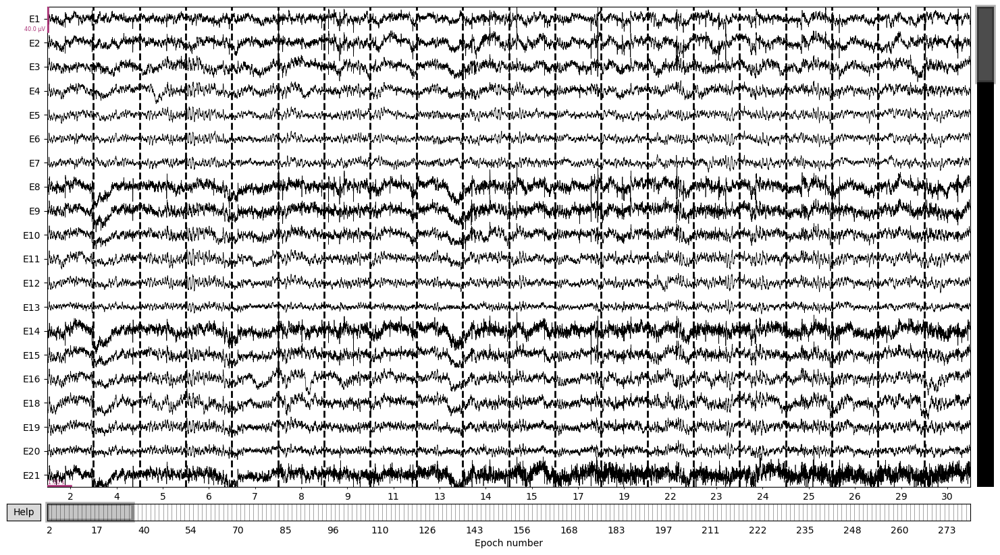

In [53]:
epochs_custom.plot()

In [36]:
data_eeg = epochs.get_data(picks='eeg')  # (n_epochs, n_ch, n_times)
ptp_all  = data_eeg.max(axis=2) - data_eeg.min(axis=2)  # (n_epochs, n_ch)

# What our code would do with ONLY the peak rule and no rule 1
n_any_120 = (ptp_all > 120e-6).any(axis=1).sum()
print(f"Epochs with ANY EEG channel > 120 µV p-p:  {n_any_120}")

ep_test = epochs.copy()
n_before = len(ep_test)
ep_test.drop_bad(reject=dict(eeg=120e-6))
print(f"MNE drop_bad(eeg=120e-6):                  {n_before - len(ep_test)}")

Epochs with ANY EEG channel > 120 µV p-p:  14
    Rejecting  epoch based on EEG : ['E3', 'E8', 'E9', 'E10', 'E11', 'E14', 'E15', 'E16', 'E18', 'E21', 'E22', 'E23', 'E25', 'E127']
    Rejecting  epoch based on EEG : ['E8', 'E9', 'E14', 'E15', 'E21', 'E22', 'E25']
    Rejecting  epoch based on EEG : ['E3', 'E8', 'E9', 'E10', 'E14', 'E15', 'E16', 'E18', 'E21', 'E22', 'E25']
    Rejecting  epoch based on EEG : ['E8', 'E9', 'E10', 'E14', 'E15', 'E21', 'E22', 'E25']
    Rejecting  epoch based on EEG : ['E127']
    Rejecting  epoch based on EEG : ['E3', 'E8', 'E9', 'E10', 'E11', 'E14', 'E15', 'E16', 'E18', 'E21', 'E22', 'E23', 'E25']
    Rejecting  epoch based on EEG : ['E3', 'E8', 'E9', 'E10', 'E11', 'E14', 'E15', 'E16', 'E18', 'E21', 'E22', 'E23', 'E25']
    Rejecting  epoch based on EEG : ['E3', 'E8', 'E9', 'E10', 'E11', 'E14', 'E15', 'E16', 'E18', 'E21', 'E22', 'E23', 'E25']
    Rejecting  epoch based on EEG : ['E8', 'E9', 'E14', 'E15', 'E16', 'E18', 'E21', 'E22', 'E25']
    Rejecting  ep

In [ ]:
# autoreject
from autoreject import AutoReject
# Dropped 11 epochs: 1, 22, 73, 80, 94, 97, 102, 138, 173, 190, 192
ar = AutoReject()
epochs_clean, reject_log = ar.fit_transform(epochs, return_log=True)

# Visual rejection log: rows=epochs, columns=channels, color=bad
reject_log.plot()

print(f"Kept {(~reject_log.bad_epochs).sum()} / {len(epochs)} epochs")

/opt/anaconda3/lib/python3.12/site-packages/autoreject/utils.py:73: UserWarning: 1 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/127 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/127 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/200 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/200 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/200 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/200 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=32


/opt/anaconda3/lib/python3.12/site-packages/autoreject/utils.py:73: UserWarning: 1 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Repairing epochs : 0/200 [00:00<?,       ?it/s]

Dropped 11 epochs: 1, 22, 73, 80, 94, 97, 102, 138, 173, 190, 192


AttributeError: 'RejectLog' object has no attribute 'good_epochs'

2026-04-16 14:37:31.261 python[64462:31063203] The class 'NSSavePanel' overrides the method identifier.  This method is implemented by class 'NSWindow'


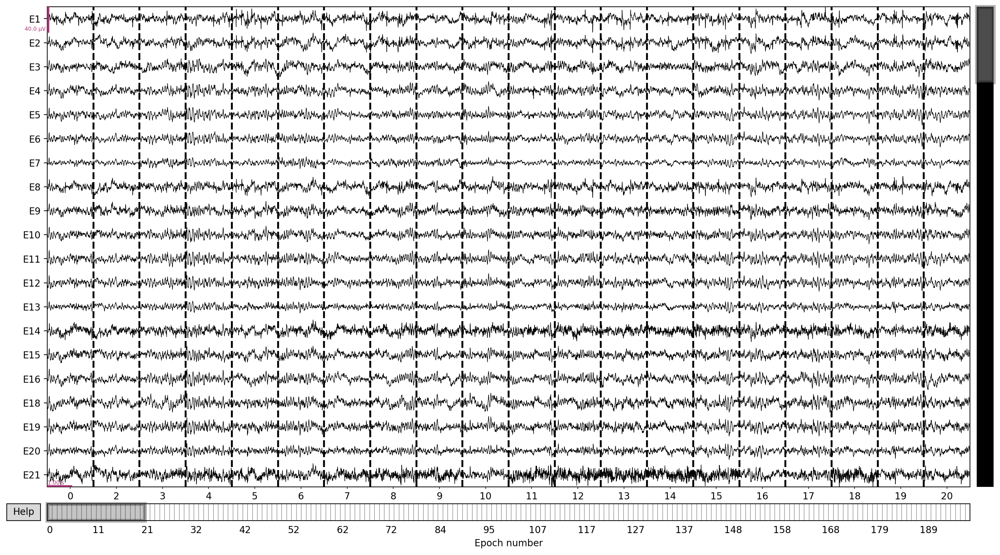

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
['E17']


In [ ]:
epochs_clean.plot()

In [47]:
import numpy as np
# labels shape: (n_epochs, n_channels)
# 0 = good, 1 = interpolated, 2 = epoch dropped
labels = reject_log.labels

n_interpolated = (labels == 1).sum()
n_epochs_dropped = reject_log.bad_epochs.sum()

print(f"Epochs dropped: {n_epochs_dropped}")
print(f"Channel-epoch pairs interpolated: {n_interpolated}")

# Which channels got interpolated most often?
ch_interp_counts = (labels == 1).sum(axis=0)
top_channels = np.argsort(ch_interp_counts)[::-1][:10]
for idx in top_channels:
    if ch_interp_counts[idx] > 0:
        print(f"  {epochs.ch_names[idx]}: interpolated in {ch_interp_counts[idx]} epochs")

Epochs dropped: 11
Channel-epoch pairs interpolated: 760
  E80: interpolated in 20 epochs
  E93: interpolated in 19 epochs
  E13: interpolated in 18 epochs
  E7: interpolated in 18 epochs
  E61: interpolated in 17 epochs
  E34: interpolated in 17 epochs
  E110: interpolated in 16 epochs
  E30: interpolated in 16 epochs
  E103: interpolated in 14 epochs
  E91: interpolated in 13 epochs


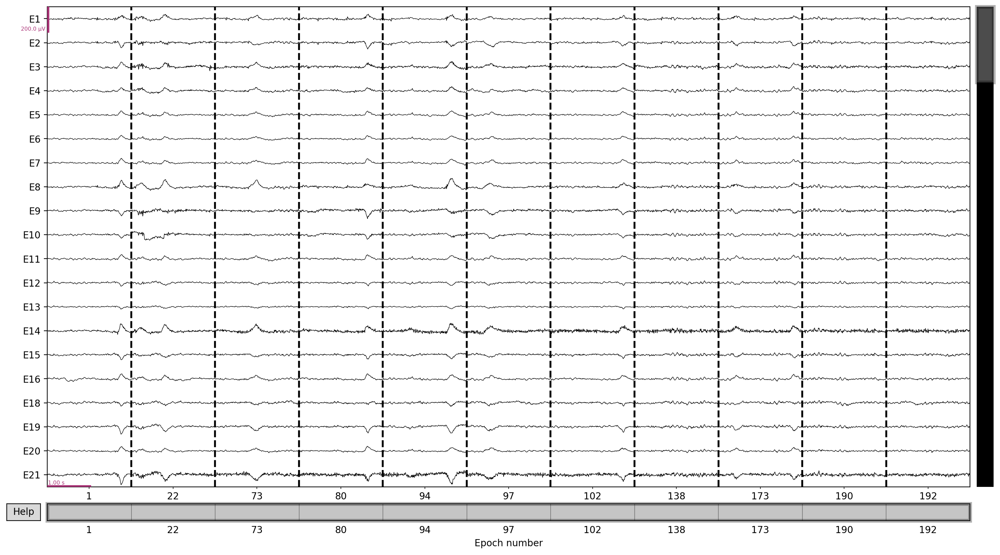

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
['E17']


In [ ]:
# visualize the dropped epochs
epochs[reject_log.bad_epochs].plot(scalings=dict(eeg=100e-6))

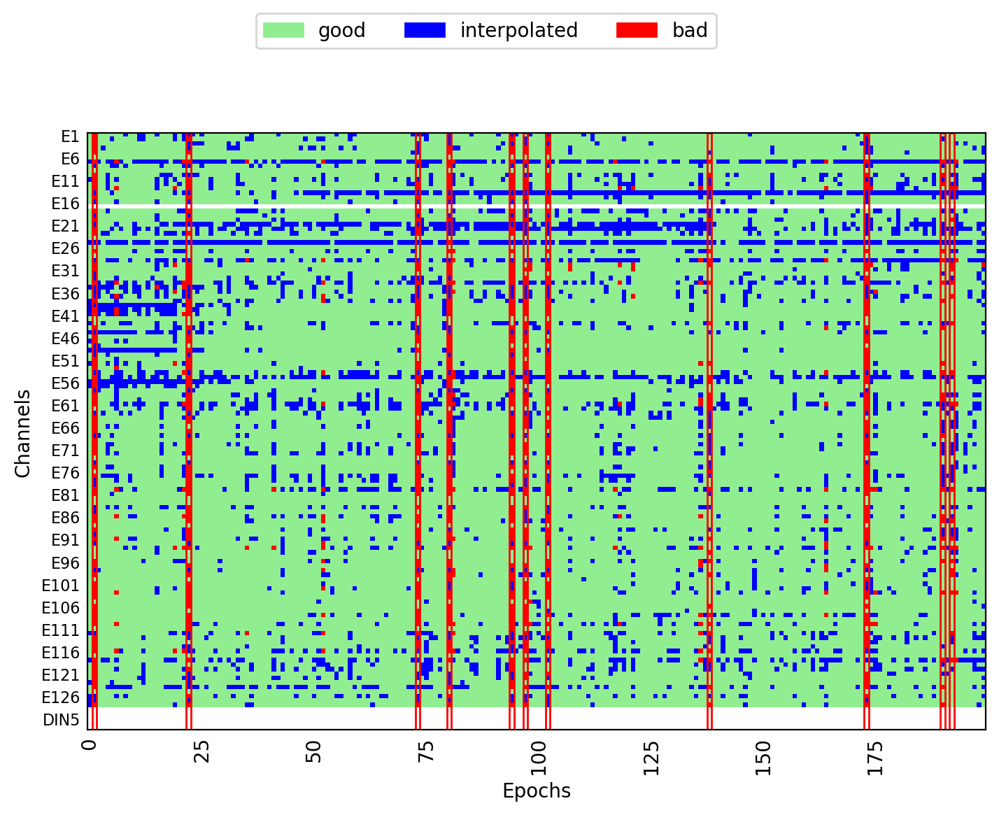

In [50]:
reject_log.plot('horizontal')

Projections have already been applied. Setting proj attribute to True.


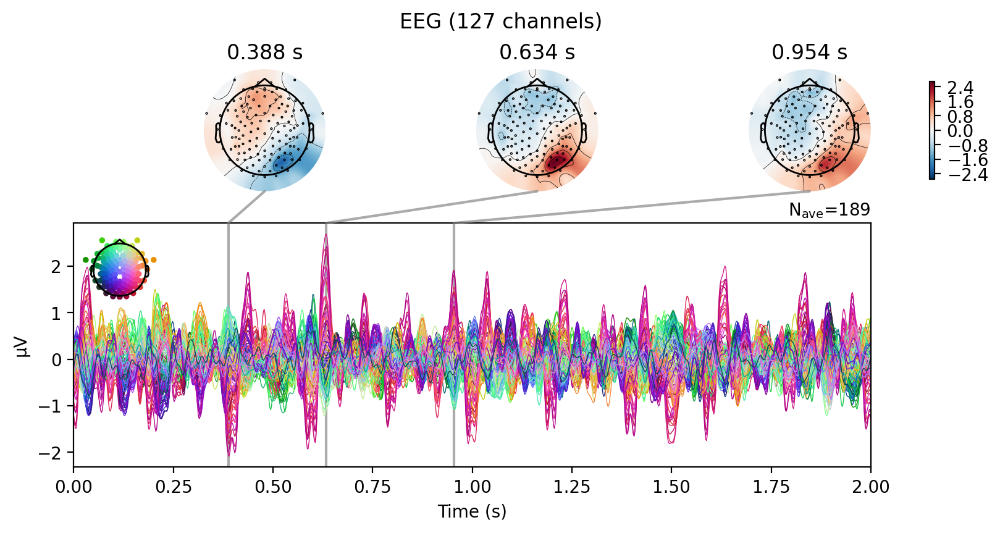

In [54]:
epochs_clean.average().plot_joint()

Projections have already been applied. Setting proj attribute to True.


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


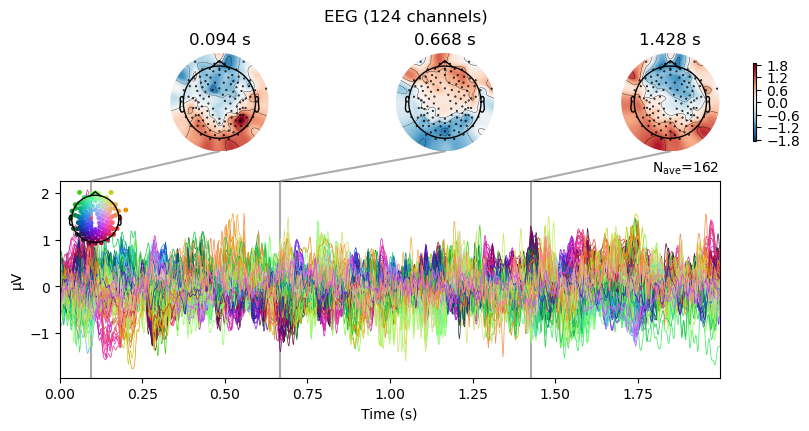

In [17]:
epochs_peak_rej.average().plot_joint()

### for SSVEP: spectral SNR
divide power at target frequency by the mean power of ±N neighboring frequency bins. That ratio is your signal above noise floor, no time-domain baseline needed.

In [18]:
# dft 

# PSD of clean epochs averaged across occipital channels
# core: E74, E82, E75,E71, E76, E83, E72, E89 
occipital_picks = mne.pick_channels_regexp(epochs_clean.ch_names, 'E7[0-7]|E8[1-5]|E8[8-9]')  # adjust for your cap

psd = epochs_clean.compute_psd(fmin=0, fmax=50, picks=occipital_picks)
psd.plot()

# harmonices: 10, 12, 15; 20, 24, 30

NameError: name 'epochs_clean' is not defined

## Spectrum Analysis

### PSD

- Multitaper: designed for broadband spectral estimation. It applies multiple orthogonal tapers and averages across them to get a stable, smooth estimate of power in a frequency band. Good for: alpha power, broadband noise floor, resting state.
- Welch: with n_fft = epoch length does essentially one windowed FFT per epoch with no within-epoch averaging. Will get the sharp peaks.

Setting 58397 of 440694 (13.25%) samples to NaN, retaining 382297 (86.75%) samples.
Effective window size : 10.000 (s)
Plotting power spectral density (dB=True).
Setting 58397 of 440694 (13.25%) samples to NaN, retaining 382297 (86.75%) samples.
Effective window size : 10.000 (s)


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


Plotting power spectral density (dB=True).


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


Effective window size : 2.000 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...
Effective window size : 2.000 (s)


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


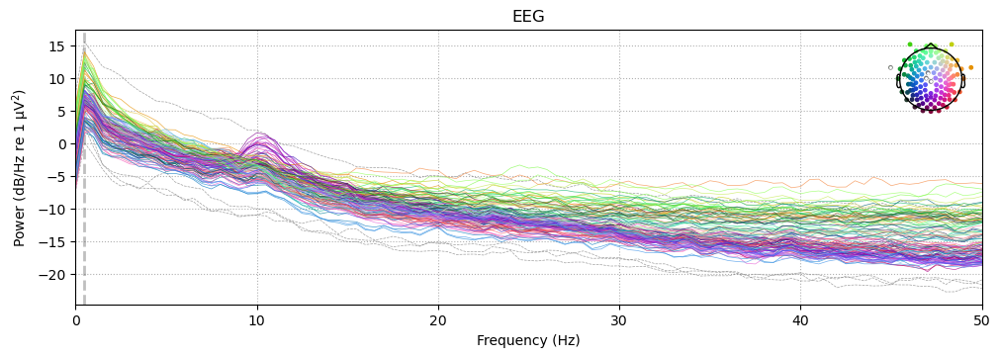

In [19]:
# raw
sfreq = 500
raw.compute_psd(fmin=0, fmax=50, picks='eeg',n_fft=sfreq*10, n_overlap=0).plot(average=False, spatial_colors=True)

raw_clean.compute_psd(fmin=0,fmax=50,picks='eeg',n_fft=sfreq*10).plot(average=False, spatial_colors=True)

epochs.compute_psd(method='welch',fmin=0, fmax=50,n_fft=len(epochs.times)).plot()

epochs_peak_rej.compute_psd(method='welch',fmin=0, fmax=50,n_fft=len(epochs.times)).plot()

Effective window size : 2.000 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


/opt/anaconda3/lib/python3.12/site-packages/mne/viz/utils.py:160: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


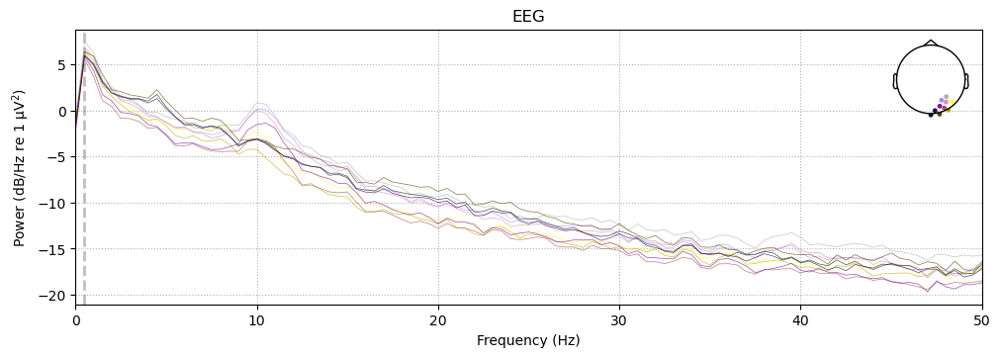

In [20]:
occipital_picks = mne.pick_channels_regexp(epochs_peak_rej.ch_names, 'E8[1-4]|E8[8-9]|E90|E91|E94|E95')  # adjust for your cap
psd = epochs_peak_rej.compute_psd(method='welch', fmin=0, fmax=50, n_fft=len(epochs_peak_rej.times), picks=occipital_picks)
psd.plot()

### DFT

In [22]:
# All EEG channels
# plot_fft_histogram(epochs_peak_rej)

# # Specific sensors by name
# occipital_picks = mne.pick_channels_regexp(epochs_peak_rej.ch_names, 'E8[1-4]|E8[8-9]|E90|E91|E94|E95')  # adjust for your cap
# plot_fft_histogram(epochs_peak_rej, picks=occipital_picks)

# Single sensor
plot_fft_histogram(epochs_peak_rej, picks=['E90'], title='FFT - E90')

# # Change frequency ceiling
# plot_fft_histogram(epochs_clean, fmax=50)


(<Figure size 1400x500 with 1 Axes>,
 <Axes: title={'center': 'FFT - E90'}, xlabel='Frequency (Hz)', ylabel='Amplitude (µV)'>)

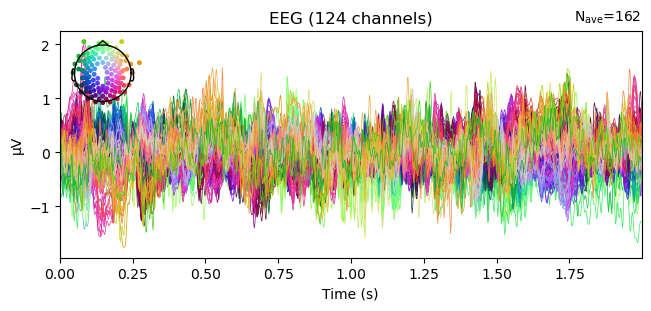

In [23]:
epochs_peak_rej.average().plot()

In [ ]:
picks = ['E90']
data = epochs_peak_rej.get_data(picks=picks)      # (n_epochs, n_channels, n_times)
sfreq = epochs_peak_rej.info['sfreq']
n_times = data.shape[-1]

freqs = np.fft.rfftfreq(n_times, d=1. / sfreq)
amplitude = np.abs(np.fft.rfft(data, axis=-1))  # (n_epochs, n_channels, n_freqs)
mean_amp = amplitude.mean(axis=(0, 1)) * 1e6     # average epochs+channels, V → µV
print(mean_amp)


[5.81402047e-04 9.64118071e-04 7.88141639e-04 6.26540653e-04
 5.54251853e-04 4.92566894e-04 4.42026154e-04 3.99161852e-04
 3.76817332e-04 3.89297020e-04 3.74147126e-04 3.63958256e-04
 3.77578371e-04 3.69585625e-04 4.41629480e-04 4.00669981e-04
 3.92163803e-04 3.89762319e-04 4.14961158e-04 4.17240141e-04
 5.86418275e-04 4.89950708e-04 5.33235917e-04 5.16037027e-04
 3.95236017e-04 2.90247726e-04 2.64403757e-04 2.32898346e-04
 2.35785843e-04 2.19879579e-04 3.15679207e-04 2.05318992e-04
 2.24805305e-04 2.03304198e-04 1.98481821e-04 1.93669353e-04
 2.14757593e-04 2.17601168e-04 2.04399557e-04 2.10017108e-04
 2.91687336e-04 1.99689607e-04 1.92726672e-04 2.16055418e-04
 2.26849866e-04 2.05790561e-04 1.89177275e-04 1.66679516e-04
 1.63458002e-04 1.49231479e-04 1.50397919e-04 1.45013701e-04
 1.37880868e-04 1.38350940e-04 1.37222645e-04 1.23519419e-04
 1.36583289e-04 1.36085961e-04 1.27694289e-04 1.32880370e-04
 1.24884705e-04 1.16522991e-04 1.16876226e-04 1.08187932e-04
 1.08760913e-04 1.067612

In [21]:
# check if the nfft is the power of 2, no pads
# check the transform on all segments
def plot_fft_histogram(epochs, picks=None, fmax=45,
                       target_freqs=[10, 12, 15, 20, 24, 30],
                       title='FFT Amplitude Histogram'):
    """
    Plot FFT amplitude spectrum at native frequency resolution.

    Averaging strategy: average complex FFT values across epochs and channels
    first, then take the magnitude. Because FFT is linear, this is equivalent
    to averaging in the time domain first. Phase-locked SSVEP responses add
    coherently; phase-random noise cancels — giving a much cleaner spectrum
    than averaging amplitudes (which would only add noise).

    Parameters
    ----------
    epochs : mne.Epochs
    picks : None | 'eeg' | list of channel names, e.g. ['E70', 'E75']
    fmax : float — upper frequency limit for display (Hz)
    target_freqs : list of float — marked with red dashed lines
    title : str
    """
    picks = picks or 'eeg'
    data = epochs.get_data(picks=picks)   # (n_epochs, n_channels, n_times)
    sfreq = epochs.info['sfreq']
    n_times = data.shape[-1]

    freqs = np.fft.rfftfreq(n_times, d=1. / sfreq)   # native frequency bins

    # Average complex FFT first → then amplitude (noise cancels, signal survives)
    complex_fft = np.fft.rfft(data, axis=-1)          # (n_epochs, n_channels, n_freqs)
    mean_amp = np.abs(complex_fft.mean(axis=(0, 1))) * 1e6   # V → µV

    # Trim to fmax
    mask = freqs <= fmax
    plot_freqs = freqs[mask]
    plot_amp   = mean_amp[mask]

    freq_res = freqs[1] - freqs[0]   # bin width (e.g. 0.5 Hz for 2 s epochs)

    fig, ax = plt.subplots(figsize=(14, 5))
    ax.bar(plot_freqs, plot_amp, width=freq_res * 0.9,
           color='steelblue', alpha=0.7, align='center')

    for f in (target_freqs or []):
        ax.axvline(f, color='red', linestyle='--', alpha=0.7, linewidth=1.2, label=f'{f} Hz')

    # Label every 5 Hz on the x-axis; target lines mark the exact frequencies
    tick_step = 5
    ax.set_xticks(np.arange(0, fmax + tick_step, tick_step))
    ax.set(xlabel='Frequency (Hz)', ylabel='Amplitude (µV)',
           title=title, xlim=[-freq_res / 2, fmax + freq_res])
    plt.tight_layout()
    return fig, ax


## Get trans for coregistration

In [122]:
dig_file='/Users/yvonnafeng/csharp_data/S001/dome/S001_try1_sorted.sfp'
eeg_montage = mne.channels.read_custom_montage(dig_file)
preproc_raw = mne.io.read_raw_fif('/Users/yvonnafeng/csharp_data/S001/eeg/S001_preproc-raw.fif')
preproc_raw.set_montage(eeg_montage, on_missing='warn')
preproc_raw.save('/Users/yvonnafeng/csharp_data/S001/eeg/S001_preproc-dig-raw.fif', overwrite=True)

Opening raw data file /Users/yvonnafeng/csharp_data/S001/eeg/S001_preproc-raw.fif...
    Read a total of 1 projection items:
        Average EEG reference (1 x 127) active
    Range : 0 ... 420083 =      0.000 ...   840.166 secs
Ready.
Writing /Users/yvonnafeng/csharp_data/S001/eeg/S001_preproc-dig-raw.fif


/var/folders/rx/k_w1968j5csfrjnxctr1xrsm0000gn/T/ipykernel_64462/3412347895.py:5: RuntimeWarning: Acquisition skips detected but did not fit evenly into output buffer_size, will be written as zeroes.
  preproc_raw.save('/Users/yvonnafeng/csharp_data/S001/eeg/S001_preproc-dig-raw.fif', overwrite=True)


Closing /Users/yvonnafeng/csharp_data/S001/eeg/S001_preproc-dig-raw.fif
[done]


[PosixPath('/Users/yvonnafeng/csharp_data/S001/eeg/S001_preproc-dig-raw.fif')]

In [ ]:
mne.gui.coregistration(subject="s001")

    Triangle neighbors and vertex normals...
Using high resolution head model in /Users/yvonnafeng/Downloads/freesurfer/subjects/s001/surf/lh.seghead
    Triangle neighbors and vertex normals...
Using fiducials from: /Users/yvonnafeng/Downloads/freesurfer/subjects/s001/bem/s001-fiducials.fif.
    Triangle neighbors and vertex normals...
Using low resolution head model in /Users/yvonnafeng/Downloads/freesurfer/subjects/AW/bem/outer_skin.surf
    Triangle neighbors and vertex normals...
Estimating fiducials from fsaverage.
Estimating fiducials from fsaverage.
Placing MRI fiducials - LPA
    Triangle neighbors and vertex normals...
Using high resolution head model in /Users/yvonnafeng/Downloads/freesurfer/subjects/s001/surf/lh.seghead
    Triangle neighbors and vertex normals...
Using fiducials from: /Users/yvonnafeng/Downloads/freesurfer/subjects/s001/bem/s001-fiducials.fif.
Loading MRI fiducials from /Users/yvonnafeng/Downloads/freesurfer/subjects/s001/bem/s001-fiducials.fif... Done!
Us

Using lh.seghead for head surface.
Channel types::	eeg: 128
Aligning using fiducials
Start median distance:  17.31 mm
End   median distance:   5.07 mm
Fitting fiducials finished in 1.58 seconds.
Channel types::	eeg: 128
Aligning using ICP
Start     median distance:   5.07 mm
  ICP  1  median distance:   4.02 mm
Fitting ICP - iteration 1
Channel types::	eeg: 128
  ICP  2  median distance:   3.07 mm
Fitting ICP - iteration 2
Channel types::	eeg: 128
  ICP  3  median distance:   2.69 mm
Fitting ICP - iteration 3
Channel types::	eeg: 128
  ICP  4  median distance:   2.67 mm
Fitting ICP - iteration 4
Channel types::	eeg: 128
  ICP  5  median distance:   2.74 mm
Fitting ICP - iteration 5
Channel types::	eeg: 128
  ICP  6  median distance:   2.72 mm
Fitting ICP - iteration 6
Channel types::	eeg: 128
  ICP  7  median distance:   2.75 mm
Fitting ICP - iteration 7
Channel types::	eeg: 128
  ICP  8  median distance:   2.77 mm
Fitting ICP - iteration 8
Channel types::	eeg: 128
End       median dis

In [124]:
epochs_clean.info

<Info | 12 non-empty values
 bads: 1 items (E17)
 ch_names: E1, E2, E3, E4, E5, E6, E7, E8, E9, E10, E11, E12, E13, E14, ...
 chs: 128 EEG, 1 misc, 4 Stimulus
 custom_ref_applied: False
 device_info: 1 item (dict)
 dig: 132 items (3 Cardinal, 129 EEG)
 highpass: 1.0 Hz
 lowpass: 50.0 Hz
 meas_date: 2026-04-01 05:50:49 UTC
 nchan: 133
 projs: Average EEG reference: on
 sfreq: 500.0 Hz
 utc_offset: -0700
>